In [ ]:
import torch
import math
import matplotlib.pyplot as plt

from PIL import Image
from diffusers import FluxPipeline
from torch import Tensor
from torchvision import transforms


DTYPE = torch.bfloat16
pipe = FluxPipeline.from_pretrained("/root/autodl-tmp/data/FLUX-dev", torch_dtype=DTYPE)
pipe.to("cuda")

In [ ]:
@torch.inference_mode()
def decode_imgs(latents, pipeline):
    imgs = (latents / pipeline.vae.config.scaling_factor) + pipeline.vae.config.shift_factor
    imgs = pipeline.vae.decode(imgs)[0]
    imgs = pipeline.image_processor.postprocess(imgs, output_type="pil")
    return imgs

@torch.inference_mode()
def encode_imgs(imgs, pipeline):
    latents = pipeline.vae.encode(imgs).latent_dist.sample()
    latents = (latents - pipeline.vae.config.shift_factor) * pipeline.vae.config.scaling_factor
    latents = latents.to(dtype=torch.bfloat16)
    return latents

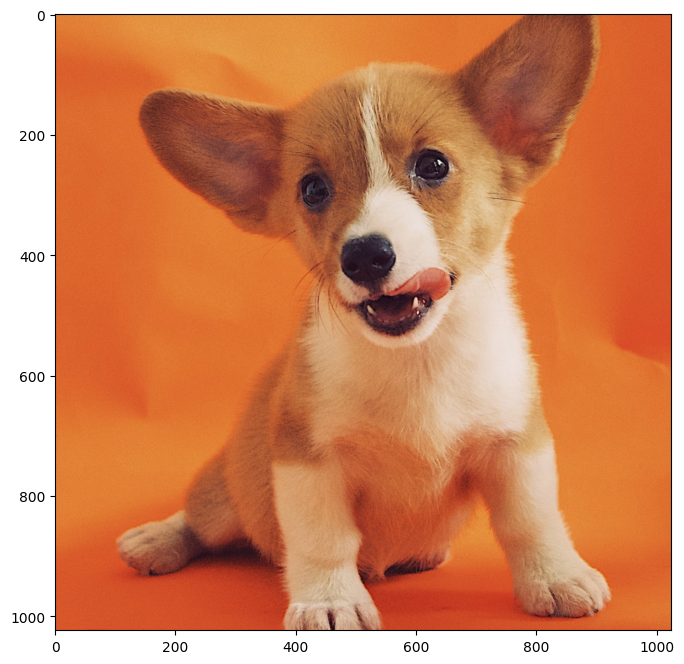

In [42]:
img = Image.open("/root/dreambooth_flux/dog/alvan-nee-9M0tSjb-cpA-unsplash.jpeg")
# plt.figure(figsize=(8, 8))
# plt.imshow(img)

train_transforms = transforms.Compose(
            [
                transforms.Resize(1024, interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.CenterCrop(1024),
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )

img = train_transforms(img).unsqueeze(0).to("cuda").to(DTYPE)


latents = encode_imgs(img, pipe)
img_rec = decode_imgs(latents, pipe)[0]

plt.figure(figsize=(8, 8))
plt.imshow(img_rec)

In [ ]:
prompt = torch.load("/root/autodl-tmp/reflow/prompt/prompt_0.pt")

print(prompt["prompt"])

print(prompt["prompt_embeds"].shape)

print(prompt["pooled_prompt_embeds"].shape)

In [ ]:
z_0 = torch.load("/root/autodl-tmp/reflow/z_0/z_0_0.pt")

print(z_0.shape) # [B, 16, H // 8, W // 8]

out = decode_imgs(z_0, pipe)[0]
plt.figure(figsize=(8, 8))
plt.imshow(out)

In [ ]:
z_1 = torch.load("/root/autodl-tmp/reflow/z_1/z_1_0.pt")
print(z_1.shape) # [B, 16, H // 8, W // 8]
out = decode_imgs(z_1, pipe)[0]
plt.figure(figsize=(8, 8))
plt.imshow(out)

In [ ]:
def time_shift(mu: float, sigma: float, t: Tensor):
    return math.exp(mu) / (math.exp(mu) + (1 / t - 1) ** sigma)

def get_lin_function(
    x1: float = 256, y1: float = 0.5, x2: float = 4096, y2: float = 1.15
):
    m = (y2 - y1) / (x2 - x1)
    b = y1 - m * x1
    return lambda x: m * x + b

def get_schedule(
    num_steps: int,
    image_seq_len: int,
    base_shift: float = 0.5,
    max_shift: float = 1.15,
    shift: bool = True,
) -> list[float]:
    # extra step for zero
    timesteps = torch.linspace(1, 0, num_steps + 1)

    # shifting the schedule to favor high timesteps for higher signal images
    if shift:
        # eastimate mu based on linear estimation between two points
        mu = get_lin_function(y1=base_shift, y2=max_shift)(image_seq_len)
        timesteps = time_shift(mu, 1.0, timesteps)

    return timesteps.tolist()

timesteps = get_schedule( # shape: [num_inference_steps]
            num_steps=100,
            image_seq_len=(1024 // 16) * (1024 // 16), # vae_scale_factor = 16
            shift=False,  # Set True for Flux-dev, False for Flux-schnell
        )

print(timesteps)

  0%|          | 0/100 [00:00<?, ?it/s]

time step: 0.0


time step: 0.010009765625
time step: 0.02001953125
time step: 0.030029296875
time step: 0.0400390625
time step: 0.050048828125
time step: 0.06005859375
time step: 0.06982421875
time step: 0.080078125
time step: 0.08984375
time step: 0.10009765625
time step: 0.10986328125
time step: 0.1201171875
time step: 0.1298828125
time step: 0.1396484375
time step: 0.150390625
time step: 0.16015625
time step: 0.169921875
time step: 0.1796875
time step: 0.1904296875
time step: 0.2001953125
time step: 0.2099609375
time step: 0.2197265625
time step: 0.23046875
time step: 0.240234375
time step: 0.25
time step: 0.259765625
time step: 0.26953125
time step: 0.279296875
time step: 0.2890625
time step: 0.30078125
time step: 0.310546875
time step: 0.3203125
time step: 0.330078125
time step: 0.33984375
time step: 0.349609375
time step: 0.359375
time step: 0.369140625
time step: 0.380859375
time step: 0.390625
time step: 0.400390625
time step: 0.41015625
time step: 0.419921875
time step: 0.4296875
time step: 0

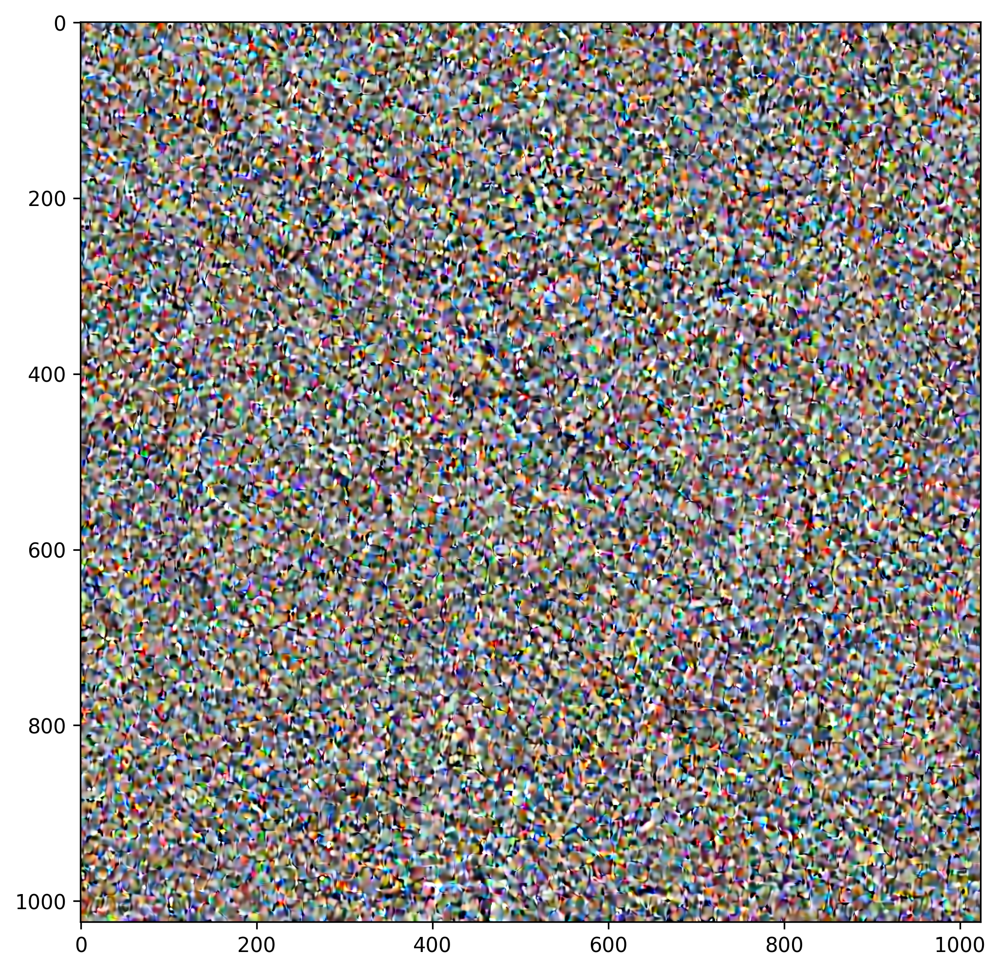

In [45]:
@torch.inference_mode()
def reverse_denoise(pipeline, timesteps, prompt_embeds, pooled_prompt_embeds, latents, guidance_scale=0.):
	timesteps = list(reversed(timesteps))
	_, _, text_ids = pipeline.encode_prompt(prompt=None, prompt_2=None, prompt_embeds=prompt_embeds, pooled_prompt_embeds=pooled_prompt_embeds)
	latent_image_ids = FluxPipeline._prepare_latent_image_ids(
        latents.shape[0],
		latents.shape[2],
		latents.shape[3],
		latents.device,
		torch.bfloat16,
    )
	packed_latents = FluxPipeline._pack_latents( # shape [num_samples, (resolution // 16 * resolution // 16), 16 * 2 * 2]
		latents,
		batch_size=latents.shape[0],
		num_channels_latents=latents.shape[1],
		height=latents.shape[2],
		width=latents.shape[3],
    )
	# Reversed denoising loop in latent space
	with pipeline.progress_bar(total=len(timesteps)-1) as progress_bar:
		for t_curr, t_prev in zip(timesteps[:-1], timesteps[1:]):
			t_vec = torch.full((packed_latents.shape[0],), t_curr, dtype=packed_latents.dtype, device=packed_latents.device)
			guidance_vec = torch.full((packed_latents.shape[0],), guidance_scale, device=packed_latents.device, dtype=packed_latents.dtype)
			print(f"time step: {t_vec[0]}")
			pred = pipeline.transformer(
					hidden_states=packed_latents, # shape: [batch_size, seq_len, num_channels_latents], e.g. [1, 4096, 64] for 1024x1024
					timestep=t_vec,        # range: [0, 1]
					guidance=guidance_vec, # scalar guidance values for each sample in the batch
					pooled_projections=pooled_prompt_embeds, # CLIP text embedding
					encoder_hidden_states=prompt_embeds,     # T5 text embedding
					txt_ids=text_ids,
					img_ids=latent_image_ids,
					joint_attention_kwargs=None,
					return_dict=pipeline,
				)[0]
			packed_latents = packed_latents + (t_prev - t_curr) * pred
			progress_bar.update()
	
	latents = FluxPipeline._unpack_latents( # save, shape [num_samples, 16, resolution//8, resolution//8]
            packed_latents,
            height=1024,
            width=1024,
            vae_scale_factor=pipeline.vae_scale_factor,
    )
	return latents

prompt_embeds = torch.zeros_like(prompt["prompt_embeds"])
pooled_prompt_embeds = torch.zeros_like(prompt["pooled_prompt_embeds"])

# prompt_embeds, pooled_prompt_embeds, _ = pipe.encode_prompt(prompt="A photo of a dog", prompt_2="A photo of a dog")

reversed_latents = reverse_denoise(pipe, timesteps, prompt_embeds, pooled_prompt_embeds, latents)

out = decode_imgs(reversed_latents, pipe)[0]

plt.figure(figsize=(8, 8), dpi=300)
plt.imshow(out)

In [ ]:
print(torch.mean(torch.abs(z_0 - reversed_latents)))

  0%|          | 0/100 [00:00<?, ?it/s]

time step: 1.0
time step: 0.98828125
time step: 0.98046875
time step: 0.96875
time step: 0.9609375
time step: 0.94921875
time step: 0.94140625
time step: 0.9296875
time step: 0.921875
time step: 0.91015625
time step: 0.8984375
time step: 0.890625
time step: 0.87890625
time step: 0.87109375
time step: 0.859375
time step: 0.8515625
time step: 0.83984375
time step: 0.828125
time step: 0.8203125
time step: 0.80859375
time step: 0.80078125
time step: 0.7890625
time step: 0.78125
time step: 0.76953125
time step: 0.76171875
time step: 0.75
time step: 0.73828125
time step: 0.73046875
time step: 0.71875
time step: 0.7109375
time step: 0.69921875
time step: 0.69140625
time step: 0.6796875
time step: 0.671875
time step: 0.66015625
time step: 0.6484375
time step: 0.640625
time step: 0.62890625
time step: 0.62109375
time step: 0.609375
time step: 0.6015625
time step: 0.58984375
time step: 0.578125
time step: 0.5703125
time step: 0.55859375
time step: 0.55078125
time step: 0.5390625
time step: 0.531

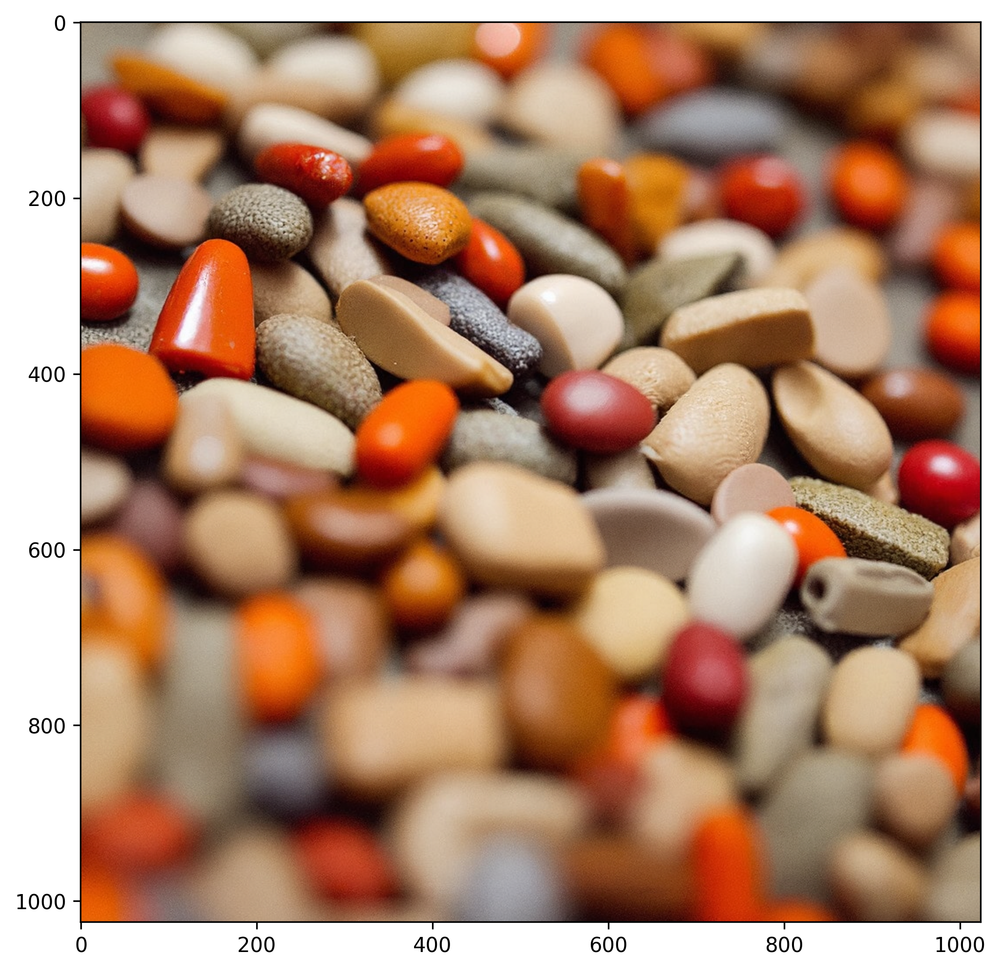

In [46]:
@torch.inference_mode()
def forward_denoise(pipeline, timesteps, prompt_embeds, pooled_prompt_embeds, latents,  guidance_scale=0.):
    _, _, text_ids = pipeline.encode_prompt(prompt=None, prompt_2=None, prompt_embeds=prompt_embeds, pooled_prompt_embeds=pooled_prompt_embeds)
    latent_image_ids = FluxPipeline._prepare_latent_image_ids(
        latents.shape[0],
        latents.shape[2],
        latents.shape[3],
        latents.device,
        torch.bfloat16,
    )
    packed_latents = FluxPipeline._pack_latents( # shape [num_samples, (resolution // 16 * resolution // 16), 16 * 2 * 2]
        latents,
        batch_size=latents.shape[0],
        num_channels_latents=latents.shape[1],
        height=latents.shape[2],
        width=latents.shape[3],
    )
    
    # Reversed denoising loop in latent space
    with pipeline.progress_bar(total=len(timesteps)-1) as progress_bar:
        for t_curr, t_prev in zip(timesteps[:-1], timesteps[1:]):
            t_vec = torch.full((packed_latents.shape[0],), t_curr, dtype=packed_latents.dtype, device=packed_latents.device)
            guidance_vec = torch.full((packed_latents.shape[0],), guidance_scale, device=packed_latents.device, dtype=packed_latents.dtype)
            print(f"time step: {t_vec[0]}")
            pred = pipeline.transformer(
                    hidden_states=packed_latents, # shape: [batch_size, seq_len, num_channels_latents], e.g. [1, 4096, 64] for 1024x1024
                    timestep=t_vec,        # range: [0, 1]
                    guidance=guidance_vec, # scalar guidance values for each sample in the batch
                    pooled_projections=pooled_prompt_embeds, # CLIP text embedding
                    encoder_hidden_states=prompt_embeds,     # T5 text embedding
                    txt_ids=text_ids,
                    img_ids=latent_image_ids,
                    joint_attention_kwargs=None,
                    return_dict=pipeline,
                )[0]
            packed_latents = packed_latents + (t_prev - t_curr) * pred
            progress_bar.update()
    
    img_latents = FluxPipeline._unpack_latents( # save, shape [num_samples, 16, resolution//8, resolution//8]
            packed_latents,
            height=1024,
            width=1024,
            vae_scale_factor=pipeline.vae_scale_factor,
    )
    return img_latents

img_latents = forward_denoise(pipe, timesteps, prompt_embeds, pooled_prompt_embeds, reversed_latents)

out = decode_imgs(img_latents, pipe)[0]

plt.figure(figsize=(8, 8), dpi=300)
plt.imshow(out)

In [ ]:
@torch.inference_mode()
def reverse_denoise(pipeline, timesteps, prompt_embeds, pooled_prompt_embeds, latents, guidance_scale=3.5):
	timesteps = list(reversed(timesteps))
	_, _, text_ids = pipeline.encode_prompt(prompt=None, prompt_2=None, prompt_embeds=prompt_embeds, pooled_prompt_embeds=pooled_prompt_embeds)
	latent_image_ids = FluxPipeline._prepare_latent_image_ids(
        latents.shape[0],
		latents.shape[2],
		latents.shape[3],
		latents.device,
		torch.bfloat16,
    )
	packed_latents = FluxPipeline._pack_latents( # shape [num_samples, (resolution // 16 * resolution // 16), 16 * 2 * 2]
		latents,
		batch_size=latents.shape[0],
		num_channels_latents=latents.shape[1],
		height=latents.shape[2],
		width=latents.shape[3],
    )
	# Reversed denoising loop in latent space
	with pipeline.progress_bar(total=len(timesteps)-1) as progress_bar:
		for t_curr, t_prev in zip(timesteps[:-1], timesteps[1:]):
			t_vec = torch.full((packed_latents.shape[0],), t_curr, dtype=packed_latents.dtype, device=packed_latents.device)
			guidance_vec = torch.full((packed_latents.shape[0],), guidance_scale, device=packed_latents.device, dtype=packed_latents.dtype)
			print(f"time step: {t_vec[0]}")
			pred = pipeline.transformer(
					hidden_states=packed_latents, # shape: [batch_size, seq_len, num_channels_latents], e.g. [1, 4096, 64] for 1024x1024
					timestep=t_vec,        # range: [0, 1]
					guidance=guidance_vec, # scalar guidance values for each sample in the batch
					pooled_projections=pooled_prompt_embeds, # CLIP text embedding
					encoder_hidden_states=prompt_embeds,     # T5 text embedding
					txt_ids=text_ids,
					img_ids=latent_image_ids,
					joint_attention_kwargs=None,
					return_dict=pipeline,
				)[0]
			packed_latents = packed_latents + (t_prev - t_curr) * pred
			progress_bar.update()
	
	latents = FluxPipeline._unpack_latents( # save, shape [num_samples, 16, resolution//8, resolution//8]
            packed_latents,
            height=1024,
            width=1024,
            vae_scale_factor=pipeline.vae_scale_factor,
    )
	return latents

reversed_latents = reverse_denoise(pipe, timesteps, prompt["prompt_embeds"], prompt["pooled_prompt_embeds"], z_1)

out = decode_imgs(reversed_latents, pipe)[0]

plt.figure(figsize=(8, 8), dpi=300)
plt.imshow(out)